# Exploratory Data Analysis
- Name: Minh T. Nguyen
- Date: 11/23/2023
- About:
    - Data preprocessing
    - Data analysis with various plots, subplots, and tables
    - Each plot needs to have title, legend, x-label, y-label, grid

In [1]:
!ls ../data

images_sample  Kaggle-renthop.torrent  note.md	train.json


**Note:** The datasets can be found [here]((https://www.kaggle.com/competitions/two-sigma-connect-rental-listing-inquiries/data?select=train.json.zip)).
- train.json: the training set.
- images_sample.zip: listing images organized by listing_id (a sample of 100 listings)
- Kaggle-renthop.7z: listing images organized by listing_id. Total size: 78.5 GB compressed.

In [2]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata
from prettytable import PrettyTable

sns.set(style="whitegrid", color_codes=True)
sns.set(font_scale=1)

import warnings
warnings.filterwarnings('ignore')

/home/mnguyen0226/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.0' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/home/mnguyen0226/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:62: UserWarning: Pandas requires version '1.3.4' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


## 1. Import dataset

In [3]:
# import the dataset
df = pd.read_json("../data/train.json")
df.head(5)

,bathrooms,bedrooms,building_id,created,description,display_address,features,latitude,listing_id,longitude,manager_id,photos,price,street_address,interest_level
4,1.0,1,8579a0b0d54db803821a35a4a615e97a,2016-06-16 05:55:27,Spacious 1 Bedroom 1 Bathroom in Williamsburg!...,145 Borinquen Place,"[Dining Room, Pre-War, Laundry in Building, Di...",40.7108,7170325,-73.9539,a10db4590843d78c784171a107bdacb4,[https://photos.renthop.com/2/7170325_3bb5ac84...,2400,145 Borinquen Place,medium
6,1.0,2,b8e75fc949a6cd8225b455648a951712,2016-06-01 05:44:33,BRAND NEW GUT RENOVATED TRUE 2 BEDROOMFind you...,East 44th,"[Doorman, Elevator, Laundry in Building, Dishw...",40.7513,7092344,-73.9722,955db33477af4f40004820b4aed804a0,[https://photos.renthop.com/2/7092344_7663c19a...,3800,230 East 44th,low
9,1.0,2,cd759a988b8f23924b5a2058d5ab2b49,2016-06-14 15:19:59,**FLEX 2 BEDROOM WITH FULL PRESSURIZED WALL**L...,East 56th Street,"[Doorman, Elevator, Laundry in Building, Laund...",40.7575,7158677,-73.9625,c8b10a317b766204f08e613cef4ce7a0,[https://photos.renthop.com/2/7158677_c897a134...,3495,405 East 56th Street,medium
10,1.5,3,53a5b119ba8f7b61d4e010512e0dfc85,2016-06-24 07:54:24,A Brand New 3 Bedroom 1.5 bath ApartmentEnjoy ...,Metropolitan Avenue,[],40.7145,7211212,-73.9425,5ba989232d0489da1b5f2c45f6688adc,[https://photos.renthop.com/2/7211212_1ed4542e...,3000,792 Metropolitan Avenue,medium
15,1.0,0,bfb9405149bfff42a92980b594c28234,2016-06-28 03:50:23,Over-sized Studio w abundant closets. Availabl...,East 34th Street,"[Doorman, Elevator, Fitness Center, Laundry in...",40.7439,7225292,-73.9743,2c3b41f588fbb5234d8a1e885a436cfa,[https://photos.renthop.com/2/7225292_901f1984...,2795,340 East 34th Street,low


## 2. Statistical Analysis

In [4]:
# check number of feature, columns
num_rows = len(df)
num_cols = len(df.columns)

print(f"Number of rows are: {num_rows}.")
print(f"Number of columns are: {num_cols}.")

Number of rows are: 49352.
Number of columns are: 15.


In [5]:
# check the stats of each features
df.describe()

,bathrooms,bedrooms,latitude,listing_id,longitude,price
count,49352.00000,49352.000000,49352.000000,4.935200e+04,49352.000000,4.935200e+04
mean,1.21218,1.541640,40.741545,7.024055e+06,-73.955716,3.830174e+03
std,0.50142,1.115018,0.638535,1.262746e+05,1.177912,2.206687e+04
min,0.00000,0.000000,0.000000,6.811957e+06,-118.271000,4.300000e+01
25%,1.00000,1.000000,40.728300,6.915888e+06,-73.991700,2.500000e+03
50%,1.00000,1.000000,40.751800,7.021070e+06,-73.977900,3.150000e+03
75%,1.00000,2.000000,40.774300,7.128733e+06,-73.954800,4.100000e+03
max,10.00000,8.000000,44.883500,7.753784e+06,0.000000,4.490000e+06


In [6]:
# check the datatypes of each features
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 49352 entries, 4 to 124009
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   bathrooms        49352 non-null  float64
 1   bedrooms         49352 non-null  int64  
 2   building_id      49352 non-null  object 
 3   created          49352 non-null  object 
 4   description      49352 non-null  object 
 5   display_address  49352 non-null  object 
 6   features         49352 non-null  object 
 7   latitude         49352 non-null  float64
 8   listing_id       49352 non-null  int64  
 9   longitude        49352 non-null  float64
 10  manager_id       49352 non-null  object 
 11  photos           49352 non-null  object 
 12  price            49352 non-null  int64  
 13  street_address   49352 non-null  object 
 14  interest_level   49352 non-null  object 
dtypes: float64(3), int64(3), object(9)
memory usage: 6.0+ MB
None


## 3. Scatter Plot & Boxen Plot

### Outlier detection

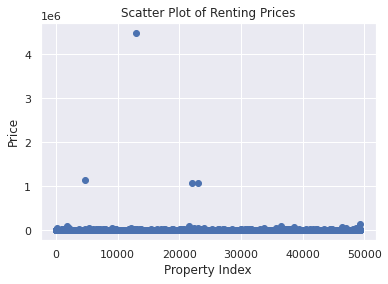

In [7]:
# price scatter plot
df_price = df["price"].values
plt.scatter(range(df.shape[0]), df_price)
plt.title("Scatter Plot of Renting Prices")
plt.xlabel("Property Index")
plt.ylabel("Price")
plt.show()

**Observation**: There's a heavy concentration of data points in the lower end of the price range indicating the the prices are mostly low. There are also extreme outliers with prices significantly higher than the rest. The presence of these outliers can heavily skew mean values, and if predicting average rental prices or establishing a pricing model, it would be advisable to remove these outliers or use median statistics.

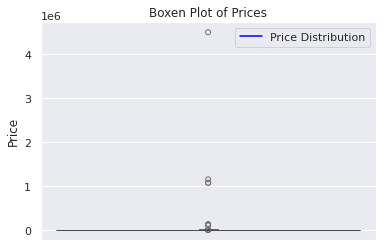

In [8]:
# similarly, we can do a boxen plot for outlier detection
sns.boxenplot(y='price', data=df)
plt.plot([], label='Price Distribution', color='blue')
plt.title('Boxen Plot of Prices')
plt.ylabel('Price')
plt.legend()
plt.show()

**Observation**: Here we can see that there are 4 data points of prices that are outliers. Since price is a numerical important factor in determining the interest-level, we want to remove the outliers. The boxen plot gives a detailed view of the distribution's shape and the presence of the outliers. The majority of the data is concentrated at the lower end of the price spectrum. Given the note provided, these outliers should likely be removed before further analysis to avoid skewing the results, especially if predictive modeling is to be performed. 

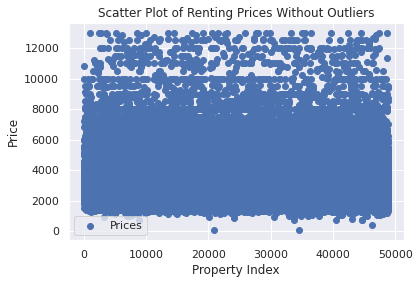

In [9]:
# outlier removal
upper_bound = np.percentile(df["price"].values, 99)
df_filtered = df[df["price"] <= upper_bound]

plt.scatter(range(df_filtered.shape[0]), df_filtered["price"], label="Prices")
plt.title("Scatter Plot of Renting Prices Without Outliers")
plt.xlabel("Property Index")
plt.ylabel("Price")
plt.legend(loc="best")
plt.show()

**Observation**: The scatter plot now shows rental prices without the extreme outliers, providing a clearer view of the main data distribution. It seems most rental prices are clustered within a lower price range, with a gradual decrease in frequency as the price increases. Such dataset is much better for predictive modeling.

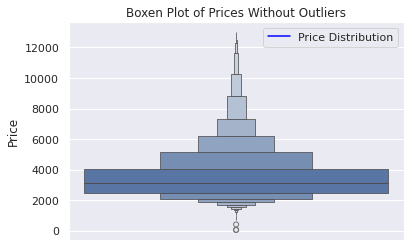

In [10]:
# similarly, we can do a boxen plot for outlier detection
sns.boxenplot(y='price', data=df_filtered)
plt.plot([], label='Price Distribution', color='blue')
plt.title('Boxen Plot of Prices Without Outliers')
plt.ylabel('Price')
plt.legend()
plt.show()

**Observation**: The boxen plot of rental prices without outliers displays a more refined distribution of the data. There's a gradual increase in rental prices with a few higher-priced rentals extending the upper whiskers of the plot. The median price is likely within the lower range, indicated by the line within the central box.

## 4. Create Features By Datetime

In [11]:
# create new date columns
df_filtered["date"] = pd.to_datetime(df_filtered['created']).dt.date # Returns numpy array of python datetime.date objects.
df_filtered["year"] = pd.to_datetime(df_filtered['created']).dt.year # The year of the datetime.
df_filtered["month"] = pd.to_datetime(df_filtered['created']).dt.month # The month as January=1, December=12.
df_filtered["day"] = pd.to_datetime(df_filtered['created']).dt.day # The day of the datetime.
df_filtered["hour"] = pd.to_datetime(df_filtered['created']).dt.hour # The hours of the datetime.
df_filtered["weekday"] = pd.to_datetime(df_filtered['created']).dt.weekday # The day of the week with Monday=0, Sunday=6.
df_filtered["quarter"] = pd.to_datetime(df_filtered['created']).dt.quarter # The quarter of the date.

In [12]:
df_filtered.head(5)

,bathrooms,bedrooms,building_id,created,description,display_address,features,latitude,listing_id,longitude,...,price,street_address,interest_level,date,year,month,day,hour,weekday,quarter
4,1.0,1,8579a0b0d54db803821a35a4a615e97a,2016-06-16 05:55:27,Spacious 1 Bedroom 1 Bathroom in Williamsburg!...,145 Borinquen Place,"[Dining Room, Pre-War, Laundry in Building, Di...",40.7108,7170325,-73.9539,...,2400,145 Borinquen Place,medium,2016-06-16,2016,6,16,5,3,2
6,1.0,2,b8e75fc949a6cd8225b455648a951712,2016-06-01 05:44:33,BRAND NEW GUT RENOVATED TRUE 2 BEDROOMFind you...,East 44th,"[Doorman, Elevator, Laundry in Building, Dishw...",40.7513,7092344,-73.9722,...,3800,230 East 44th,low,2016-06-01,2016,6,1,5,2,2
9,1.0,2,cd759a988b8f23924b5a2058d5ab2b49,2016-06-14 15:19:59,**FLEX 2 BEDROOM WITH FULL PRESSURIZED WALL**L...,East 56th Street,"[Doorman, Elevator, Laundry in Building, Laund...",40.7575,7158677,-73.9625,...,3495,405 East 56th Street,medium,2016-06-14,2016,6,14,15,1,2
10,1.5,3,53a5b119ba8f7b61d4e010512e0dfc85,2016-06-24 07:54:24,A Brand New 3 Bedroom 1.5 bath ApartmentEnjoy ...,Metropolitan Avenue,[],40.7145,7211212,-73.9425,...,3000,792 Metropolitan Avenue,medium,2016-06-24,2016,6,24,7,4,2
15,1.0,0,bfb9405149bfff42a92980b594c28234,2016-06-28 03:50:23,Over-sized Studio w abundant closets. Availabl...,East 34th Street,"[Doorman, Elevator, Fitness Center, Laundry in...",40.7439,7225292,-73.9743,...,2795,340 East 34th Street,low,2016-06-28,2016,6,28,3,1,2


## 5. Line Plot

### Line plot of prices

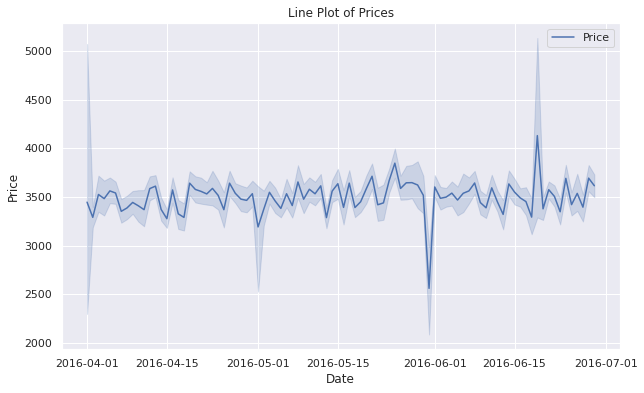

In [13]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_filtered, x="date", y="price", label="Price")
plt.title('Line Plot of Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

**Observation**: The line plot shows the price trend over time suggesting that rental prices fluctuate but do not exhibit a clear long-term trend in the given timeframe. There are spikes in rental prices that could correspond to specific events or seasonal demand changes. However, since we don't have an entire year-dataset, it's hard to determine the seasonality of the price trends.

## 6. Bar Plot 

### Number of bedrooms

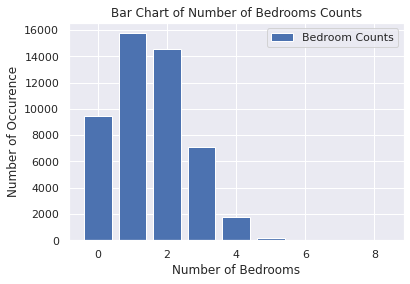

In [14]:
bedroom_counts = df_filtered["bedrooms"].value_counts()
plt.bar(bedroom_counts.index, bedroom_counts.values, label="Bedroom Counts")
plt.title("Bar Chart of Number of Bedrooms Counts")
plt.xlabel("Number of Bedrooms")
plt.ylabel("Number of Occurence")
plt.legend()
plt.show()

**Observation**: The bar chart shows the frequency of listings by the number of bedrooms. One-bedroom and two-bedroom apartments are the most common, with a significant drop-off in the number of listings as the number of bedrooms increases. Ranked 3rd is studio. This distribution is typical of urban housing markets, where smaller living spaces are more prevalent. The data suggests that single individuals or small families might be the primary target demographic for the rental market in New York City. Properties with more than three bedrooms are considerably less common, which may indicate a lower demand or a smaller supply of larger apartments.

### Number of bathrooms

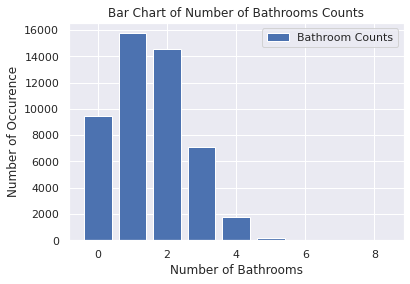

In [15]:
bathroom_counts = df_filtered["bathrooms"].value_counts()
plt.bar(bedroom_counts.index, bedroom_counts.values, label="Bathroom Counts")
plt.title("Bar Chart of Number of Bathrooms Counts")
plt.xlabel("Number of Bathrooms")
plt.ylabel("Number of Occurence")
plt.legend()
plt.show()

**Observation**: The bar chart depicting the number of bathrooms in listings shows that one-bathroom units are the most common, followed by two-bathroom units. The frequency of listings sharply decreases as the number of bathrooms increases, with three or more bathrooms being relatively rare. This pattern suggests that the housing market in New York City primarily caters to singles and small families, which is consistent with urban apartment offerings. Properties with a higher number of bathrooms are less common and could potentially cater to a luxury market segment.

## 7. Count Plot

### Check the interest level given an hour

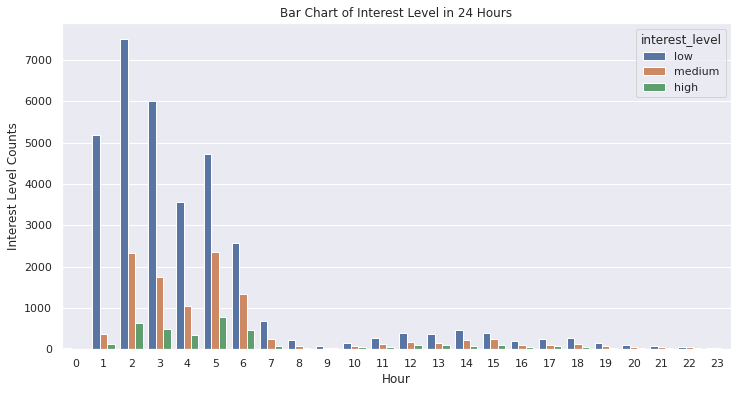

In [16]:
fig = plt.figure(figsize=(12,6))
sns.countplot(x="hour", hue="interest_level", hue_order=['low', 'medium', 'high'], data=df_filtered);
plt.title("Bar Chart of Interest Level in 24 Hours")
plt.xlabel("Hour")
plt.ylabel("Interest Level Counts")
plt.show()

**Observation**: The bar chart illustrates the counts of interest levels for rental listings throughout different hours of the day. There is a notable peak in activity during the early hours (likely around midnight), with a high volume of low-interest levels. Interest levels taper off during the early morning hours and start to rise again around conventional working hours. High interest seems proportionally higher during the night, possibly indicating a time when serious renters are more active. The trend suggests that listing visibility and engagement could be optimized by timing postings to coincide with these peak hours.

### Check the interest level given a year

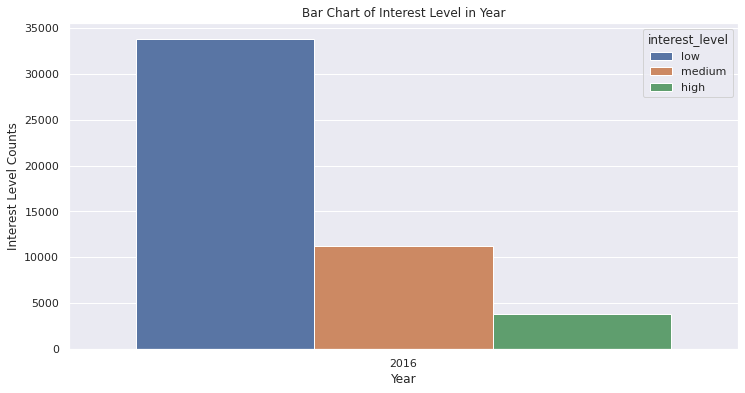

In [17]:
fig = plt.figure(figsize=(12,6))
sns.countplot(x="year", hue="interest_level", hue_order=['low', 'medium', 'high'], data=df_filtered);
plt.title("Bar Chart of Interest Level in Year")
plt.xlabel("Year")
plt.ylabel("Interest Level Counts")
plt.show()

**Observation**: The bar chart shows the distribution of interest levels for rental listings over a year, with only one year displayed (2016). The majority of listings have a low interest level, followed by medium and then high. 

### Check the interest level given a month

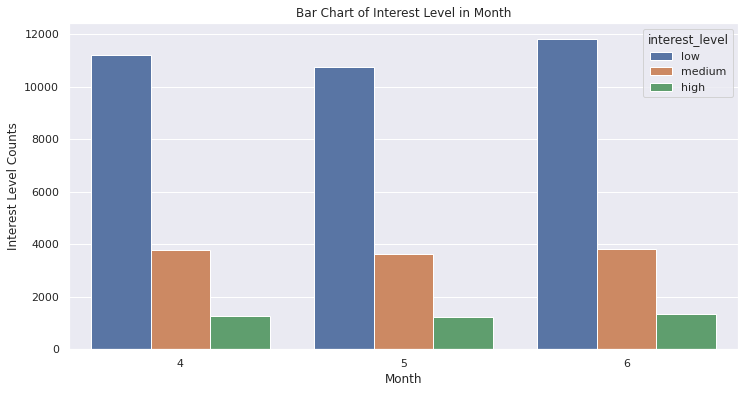

In [18]:
fig = plt.figure(figsize=(12,6))
sns.countplot(x="month", hue="interest_level", hue_order=['low', 'medium', 'high'], data=df_filtered);
plt.title("Bar Chart of Interest Level in Month")
plt.xlabel("Month")
plt.ylabel("Interest Level Counts")
plt.show()

**Observation**: The bar chart compares the interest level counts across three months, showing a clear seasonal trend. Interest levels, both low and medium, are highest in June and lower in the preceding months. The high interest levels do not show a significant monthly variation, suggesting that high interest properties are consistently sought after, regardless of the season. This trend could imply that there is more rental activity during the summer months, which is common in real estate markets due to various factors such as the end of the school year and the peak moving season (internship, co-op,...).

### Check the interest level given a day in a month

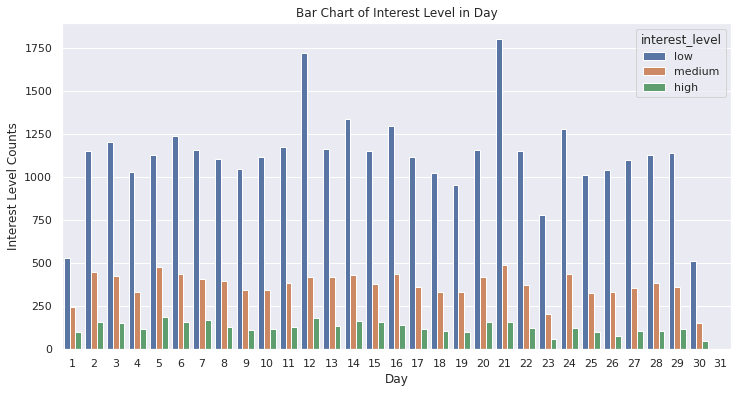

In [19]:
fig = plt.figure(figsize=(12,6))
sns.countplot(x="day", hue="interest_level", hue_order=['low', 'medium', 'high'], data=df_filtered);
plt.title("Bar Chart of Interest Level in Day")
plt.xlabel("Day")
plt.ylabel("Interest Level Counts")
plt.show()

**Observation**: The bar chart indicates daily interest level counts within a month. Interest levels fluctuate throughout the month, with some days showing pronounced peaks in medium and low interest. These peaks could correlate with specific days of the week or month, such as weekends or mid-month, which are often associated with increased rental activity. The consistent presence of high-interest listings across days suggests a steady demand for certain properties. 

### Check the interest level given a weekday

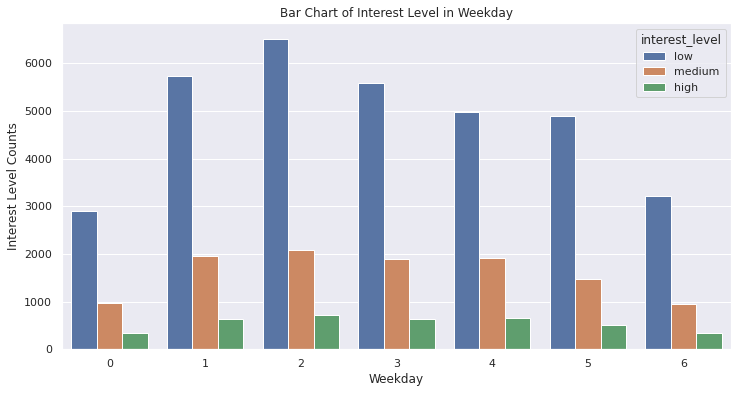

In [20]:
fig = plt.figure(figsize=(12,6))
sns.countplot(x="weekday", hue="interest_level", hue_order=['low', 'medium', 'high'], data=df_filtered);
plt.title("Bar Chart of Interest Level in Weekday")
plt.xlabel("Weekday")
plt.ylabel("Interest Level Counts")
plt.show()

**Observation**: The bar chart illustrates the interest level counts across weekdays. It shows varying levels of interest for rental listings, with the lowest levels of interest typically on the first day of the week and higher interest levels in the middle of the week. The trend suggests that renters might be more actively looking for listings during mid-week rather than at the beginning or end of the week. 

### Check the interest level given a quarter

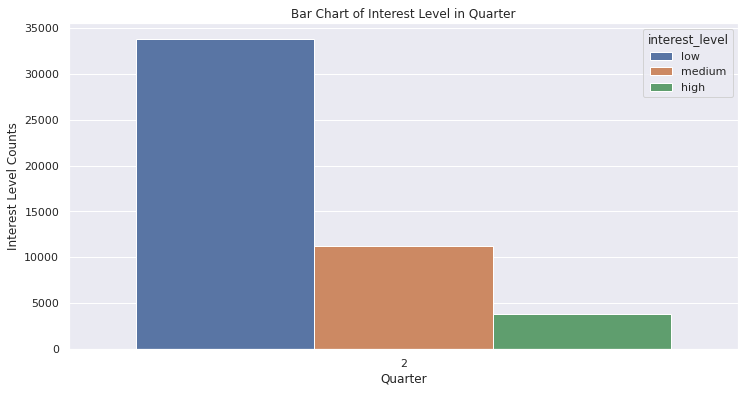

In [21]:
fig = plt.figure(figsize=(12,6))
sns.countplot(x="quarter", hue="interest_level", hue_order=['low', 'medium', 'high'], data=df_filtered);
plt.title("Bar Chart of Interest Level in Quarter")
plt.xlabel("Quarter")
plt.ylabel("Interest Level Counts")
plt.show()

**Observation**: The bar chart indicates the interest level counts segmented by quarters. With only the second quarter shown, there's a significant number of listings with low interest, a moderate amount with medium interest, and relatively few with high interest. 

## 8. Pie Chart

### Percentage of interest level

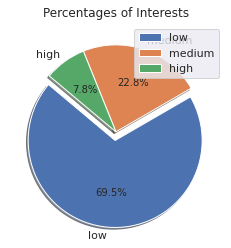

In [22]:
# plot pie chart
df_interest_split = df.interest_level.value_counts().values
df_interest_label = ["low", "medium", "high"]
explode = (0.1, 0, 0)
plt.pie(df_interest_split, explode=explode, labels=df_interest_label, autopct='%1.1f%%', shadow=True, startangle=140)
plt.title("Percentages of Interests")
plt.legend(df_interest_label, loc="best")
plt.show()

**Observation**: The pie chart presents the distribution of interest levels across rental listings. A large majority of the listings have a low interest level, while a smaller fraction have medium interest, and only a very small percentage show high interest. This distribution suggests that most of the listings fail to engage potential renters, which could be due to various factors like price, location, features, or listing quality. The low percentage of high interest listings may indicate a competitive market where only a few listings stand out enough to attract a high volume of potential renters.

## 9. Dist Plot

### Distplot of prices

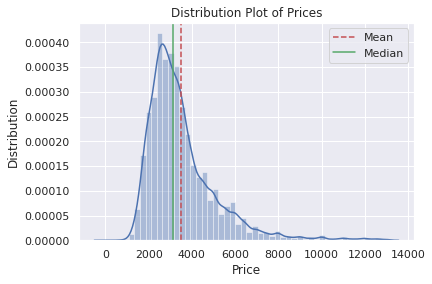

In [23]:
sns.distplot(df_filtered["price"])

# add means and variance to plot
plt.axvline(x=df_filtered["price"].mean(), color='r', linestyle='--', label='Mean')
plt.axvline(x=df_filtered["price"].median(), color='g', linestyle='-', label='Median')

plt.title('Distribution Plot of Prices')
plt.xlabel('Price')
plt.ylabel('Distribution')
plt.legend()
plt.show()

**Observation**: The distribution plot of rental prices, with a KDE overlay, indicates that the distribution of prices is right-skewed, meaning there are a number of higher-priced listings pulling the mean above the median. The median price is a better indicator of the central tendency for this dataset due to the skew. The skewness in the price distribution suggests that while most of the rentals are at a lower price point, there are enough premium-priced rentals to skew the average price higher. This could be indicative of a market with diverse rental options, catering to both budget and luxury segments.

## 10. Pair Plot

### Pair plot of features

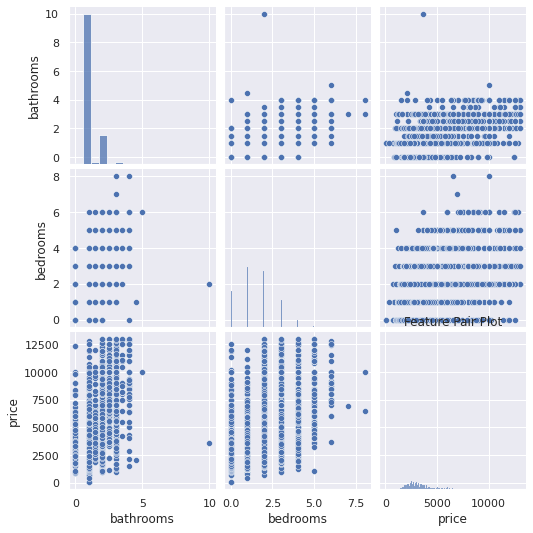

In [24]:
sns.pairplot(df_filtered[['bathrooms', 'bedrooms', 'price']])
plt.title('Feature Pair Plot')
plt.show()

**Observation**: The pair plot indicates relationships between the number of bathrooms, bedrooms, and price. There appears to be a positive correlation between the number of bathrooms and bedrooms, which is intuitive as larger homes tend to have more of both. The scatter plots also suggest a positive correlation between price and both the number of bedrooms and bathrooms, indicating that as the count of these features increases, so does the price. There are clusters of data points at lower bedroom and bathroom counts, illustrating a higher concentration of smaller and likely more affordable listings.

## 11. Heatmap With Cbar

### Heatmap of features

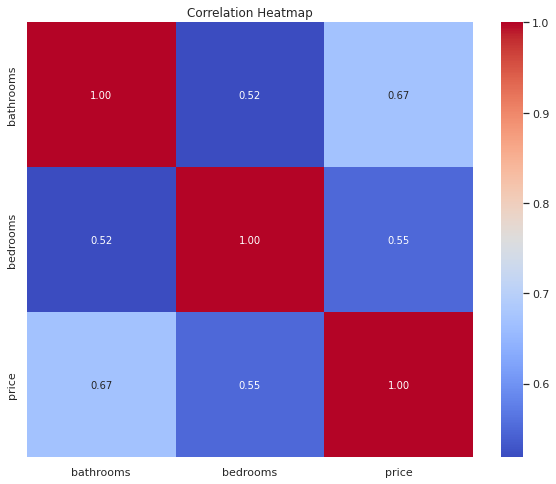

In [25]:
# get the correlation
corr = df_filtered[['bathrooms', 'bedrooms', 'price']].corr()

plt.figure(figsize=(10, 8))  
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
cbar = plt.gcf().axes[-1]
plt.title('Correlation Heatmap')
plt.show()

**Observation**: The heatmap displays the correlation matrix for bathrooms, bedrooms, and price. The values, ranging from 0.52 to 0.67, indicate a moderate positive correlation between these features. This means as the number of bedrooms or bathrooms increases, the price tends to increase as well. The strongest correlation is between price and the number of bathrooms, suggesting that the number of bathrooms may be a more significant factor in determining the price than the number of bedrooms. This could be useful for modeling price predictions or understanding what features contribute most to rental costs.

## 12. Histogram Plot With KDE

### KDE of prices

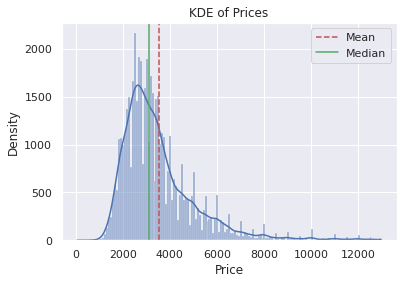

In [26]:
# similarly, histogram plot with KDE
sns.histplot(data=df_filtered, x="price", kde=True)

# add means and variance to plot
plt.axvline(x=df_filtered["price"].mean(), color='r', linestyle='--', label='Mean')
plt.axvline(x=df_filtered["price"].median(), color='g', linestyle='-', label='Median')

plt.title('KDE of Prices')
plt.xlabel('Price')
plt.ylabel('Density')
plt.legend()
plt.show()

**Observation**: The KDE plot with the histogram shows the price distribution of rental listings. The distribution is right-skewed, with a peak indicating that most of the rentals are in the lower price range. The mean is higher than the median, which is typical for a right-skewed distribution, indicating that higher-priced rentals pull the average up. The peak near the lower end of the price axis suggests that there is a high density of more affordable rentals. This kind of distribution is often seen in real estate markets where there are a few luxury listings that are significantly more expensive than the majority of the market.

## 13. QQ-Plot

### QQ plot for price with log transformation

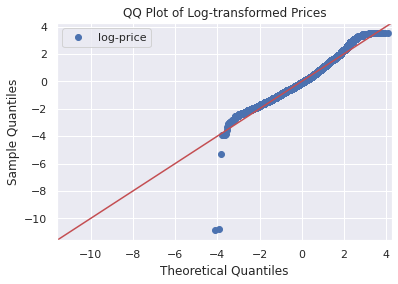

In [27]:
prices = np.log1p(df_filtered['price'])
sm.qqplot(prices, line ='45', fit=True, label="log-price")
plt.title('QQ Plot of Log-transformed Prices')
plt.legend()
plt.show()

**Observation**: The QQ plot of log-transformed prices shows that the distribution of prices does not perfectly follow a normal distribution, as the points deviate from the red line, especially at the lower and higher quantiles. This suggests that even after a log transformation, there are extreme values in the data. The heavier tails indicate that there is more variability in rental prices than what would be expected in a normal distribution, with a higher occurrence of both very low and very high prices.

## 14. Customed KDE Plot

### KDE of prices

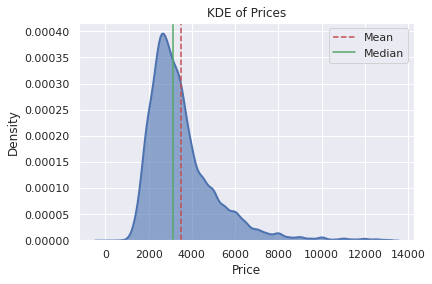

In [28]:
sns.kdeplot(df_filtered["price"], fill=True, alpha=0.6, linewidth=2)

# add means and variance to plot
plt.axvline(x=df_filtered["price"].mean(), color='r', linestyle='--', label='Mean')
plt.axvline(x=df_filtered["price"].median(), color='g', linestyle='-', label='Median')

plt.title('KDE of Prices')
plt.xlabel('Price')
plt.ylabel('Density')
plt.legend()
plt.show()

**Observation**: The KDE plot for the prices showcases a right-skewed distribution, which is typical for real estate data where a few high-priced listings can skew the average price upward. The plot includes lines for mean and median prices, with the median lying to the left of the mean, further confirming the skewness. The area under the curve is filled, providing a visual representation of the price density. The peak near the lower end of the price axis indicates that most of the rentals are priced at the lower end of the market.

## 15. Reg Plot With Scatter Representation & Regression Line

### Regression plot between bedrooms and bathrooms

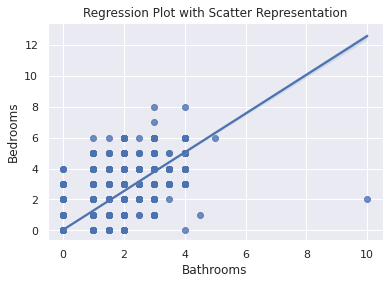

In [29]:
sns.regplot(x='bathrooms', y='bedrooms', data=df_filtered, scatter=True, fit_reg=True)
plt.title('Regression Plot with Scatter Representation')
plt.xlabel('Bathrooms')
plt.ylabel('Bedrooms')
plt.show()

**Observation**: The regression plot with scatter representation shows a positive correlation between the number of bathrooms and bedrooms in rental listings. The trend line suggests that as the number of bathrooms increases, the number of bedrooms typically increases as well. Most data points cluster at the lower end of both axes, indicating that listings with fewer bedrooms and bathrooms are more common. There are some outliers with a high number of bathrooms compared to bedrooms, which may represent unique or luxury properties. 

### Regression plot between bedrooms and price

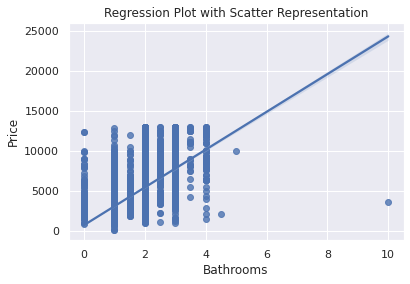

In [30]:
sns.regplot(x='bathrooms', y='price', data=df_filtered, scatter=True, fit_reg=True)
plt.title('Regression Plot with Scatter Representation')
plt.xlabel('Bathrooms')
plt.ylabel('Price')
plt.show()

**Observation**: The regression plot illustrates a positive correlation between the number of bathrooms in a property and its price. As the number of bathrooms increases, the price also tends to rise. However, the scatter plot reveals that most data points are concentrated at the lower end of the bathroom count, with prices showing a wide range even for properties with the same number of bathrooms. This variability indicates that while the number of bathrooms is a factor in pricing, there are likely other significant factors influencing the price as well. The presence of a few outliers suggests some exceptionally priced properties, potentially luxury units with a high number of bathrooms.

### Regression plot between bathrooms and bathrooms

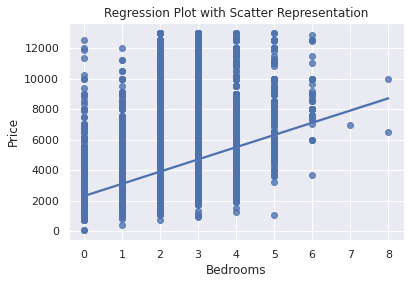

In [31]:
sns.regplot(x='bedrooms', y='price', data=df_filtered, scatter=True, fit_reg=True)
plt.title('Regression Plot with Scatter Representation')
plt.xlabel('Bedrooms')
plt.ylabel('Price')
plt.show()

**Observation**: The regression plot suggests a positive correlation between the number of bedrooms and the price of rental properties. The general trend shows that as the number of bedrooms increases, so does the price. However, there is significant variability in price within properties with the same number of bedrooms, indicating other factors also play a crucial role in determining rental prices. Additionally, the data points for properties with higher bedroom counts are sparser, suggesting fewer listings and potentially a niche or luxury market.

## 16. Area Plot

### Area plot of average price over time

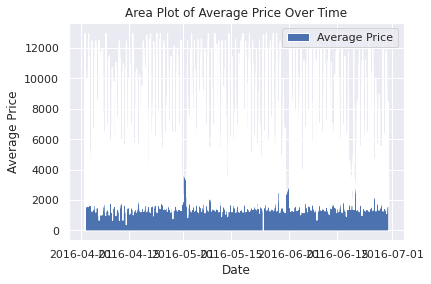

In [32]:
df_filtered['created'] = pd.to_datetime(df_filtered['created'])
df_filtered_area = df_filtered.sort_values('created')
price_over_time = df_filtered_area.groupby('created')['price'].mean()
plt.fill_between(price_over_time.index, price_over_time.values, label="Average Price")
plt.title('Area Plot of Average Price Over Time')
plt.xlabel('Date')
plt.ylabel('Average Price')
plt.legend()
plt.show()

**Observation**: The area plot depicts the average price of listings over time. It shows significant fluctuations in price, with peaks and troughs indicating variability in the rental market on a day-to-day basis. Such volatility could be driven by various factors, including market demand, the introduction of new high-priced listings, or the removal of existing listings. The plot suggests that while there are general trends in average prices, there can be considerable variation within short time periods. 

## 17. Violin Plot

### Violin plot of interest rate vs price

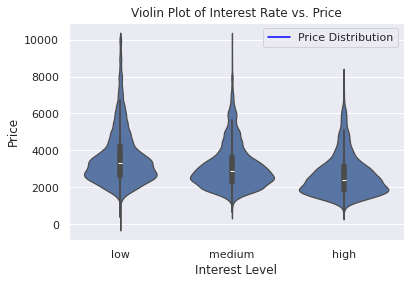

In [33]:
sns.violinplot(x="interest_level", y="price", order=['low', 'medium', 'high'],
               data=df_filtered[df_filtered.price<=df_filtered.price.quantile(0.99)]);
plt.plot([], label='Price Distribution', color='blue')
plt.title('Violin Plot of Interest Rate vs. Price')
plt.xlabel('Interest Level');
plt.ylabel('Price');
plt.legend()
plt.show()

**Observation**: The violin plot illustrates the distribution of prices at different interest levels. It shows that lower-priced listings have a wider range of prices and are more commonly found at the 'low' interest level, while the 'high' interest level has a narrower price distribution, indicating that high-interest listings are more consistently priced. The 'medium' interest level shows a price distribution that is somewhat between the 'low' and 'high' interest levels. This could suggest that listings with very high or very low prices do not attract as much interest as those with moderate prices.

## 18. Joint Plot With KDE & Scatter Representation

### Joint plot betwee bedrooms, interest rate, and price

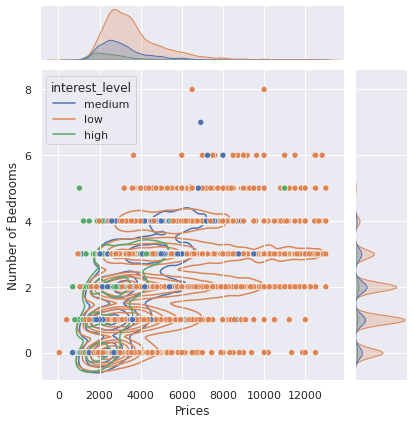

In [34]:
sns.jointplot(data=df_filtered, x="price", y="bedrooms", hue="interest_level", kind='scatter', color='b').plot_joint(sns.kdeplot, zorder=0, levels=6)
plt.xlabel('Prices');
plt.ylabel('Number of Bedrooms');
plt.show()

**Observation**: The joint plot showcases the relationship between the price, the number of bedrooms, and the interest level of listings. The scatter points are color-coded by interest level, indicating that listings with high interest are not necessarily those with the highest price or most bedrooms. It suggests that while there might be a trend for higher prices with more bedrooms, the interest level is influenced by factors beyond just these two. The distribution (marginal histograms) on the top and right show that most listings have fewer bedrooms and a lower price range, with interest level distributed across these factors.

### Joint plot betwee bathrooms, interest rate, and price

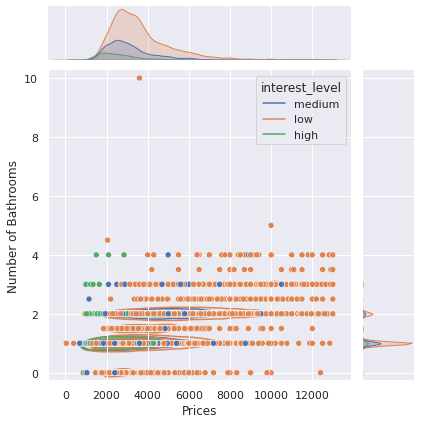

In [35]:
sns.jointplot(data=df_filtered, x="price", y="bathrooms", hue="interest_level", kind='scatter', color='b').plot_joint(sns.kdeplot, zorder=0, levels=6)
plt.xlabel('Prices');
plt.ylabel('Number of Bathrooms');
plt.show()

**Observation**: The joint plot indicates a positive relationship between the number of bathrooms in a property and its price, color-coded by interest level. While higher-priced listings tend to have more bathrooms, the interest level doesn't seem exclusively higher for these properties, suggesting that factors other than the number of bathrooms and price contribute to the interest level. The density plots on the top and right show the distribution of prices and bathroom counts, respectively, with most properties featuring fewer bathrooms and a lower price range. High-interest listings are scattered across various price points and bathroom counts.

## 19. Rug Plot

### Rug plot of price

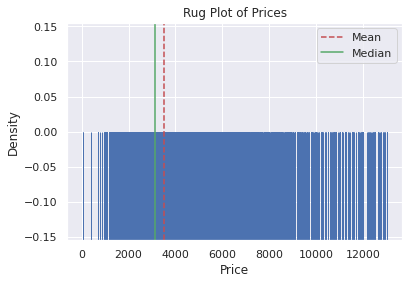

In [36]:
sns.rugplot(data=df_filtered, x="price", height=0.5)

# add means and variance to plot
plt.axvline(x=df_filtered["price"].mean(), color='r', linestyle='--', label='Mean')
plt.axvline(x=df_filtered["price"].median(), color='g', linestyle='-', label='Median')

plt.title('Rug Plot of Prices')
plt.xlabel('Price')
plt.ylabel('Density')
plt.legend()
plt.show()

**Observation**: The rug plot visualizes the distribution of rental prices along the price axis. Each tick represents an individual listing's price. The concentration of ticks at the lower end of the price scale indicates a higher density of more affordable listings. The mean and median are marked, showing the mean to the right of the median due to the right-skewed distribution of prices. This suggests that while the majority of listings are less expensive, there are enough high-priced listings to skew the average price higher. The rug plot confirms that the distribution of prices is not symmetrical and is weighted towards the lower end.

## 20. 3D Plot & Contour Plot

### 3D plot of sampled dataset

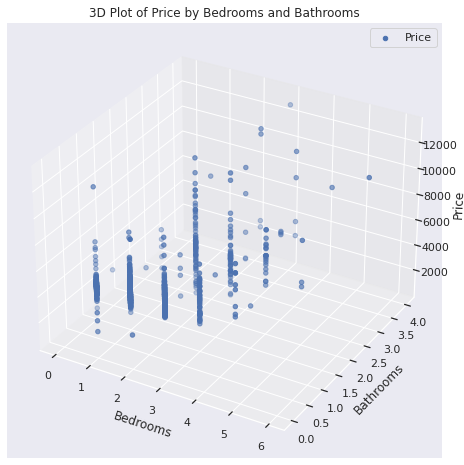

In [37]:
sampled_df = df_filtered[['bedrooms', 'bathrooms', 'price']].sample(n=1000)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(sampled_df['bedrooms'], sampled_df['bathrooms'], sampled_df['price'], label="Price")
ax.set_xlabel('Bedrooms')
ax.set_ylabel('Bathrooms')
ax.set_zlabel('Price')
plt.title('3D Plot of Price by Bedrooms and Bathrooms')
ax.legend([scatter], ["Price"])
plt.show()

**Observation**: The 3D scatter plot provides a visual representation of the relationship between the number of bedrooms and bathrooms against the price. It shows that generally, as the number of bedrooms and bathrooms increases, so does the price. The plot also reveals the distribution of data points, with a concentration in the lower bedroom and bathroom range, indicating a greater number of more affordable listings. The spread in the 'price' dimension suggests variability in pricing at similar bedroom and bathroom counts, which could be due to other factors like location, amenities, and apartment size.

### Contour plot of the sampled dataset

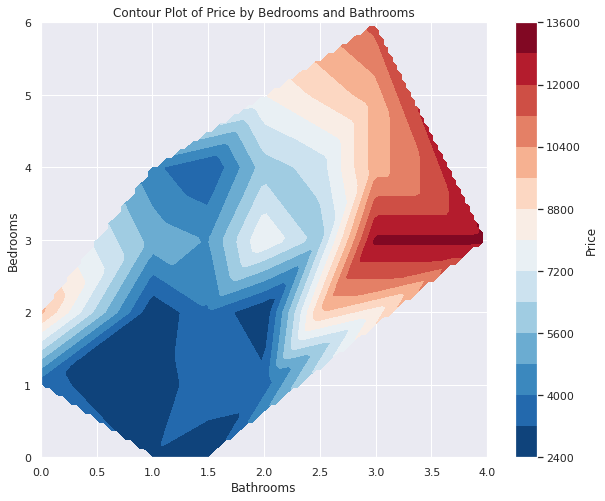

In [38]:
xi = np.linspace(sampled_df['bathrooms'].min(), sampled_df['bathrooms'].max(), 100)
yi = np.linspace(sampled_df['bedrooms'].min(), sampled_df['bedrooms'].max(), 100)
zi = griddata((sampled_df['bathrooms'], sampled_df['bedrooms']), sampled_df['price'], (xi[None, :], yi[:, None]), method='linear')

fig = plt.figure(figsize=(10, 8))
contour = plt.contourf(xi, yi, zi, 14, cmap=plt.cm.RdBu_r)
plt.colorbar(contour, label='Price')
plt.xlabel('Bathrooms')
plt.ylabel('Bedrooms')
plt.title('Contour Plot of Price by Bedrooms and Bathrooms')
plt.show()

**Observation**: The contour plot visualizes the price distribution across different numbers of bedrooms and bathrooms. It suggests a general trend where price increases with the number of bathrooms and bedrooms. The most significant price increases are observed in properties with higher numbers of bathrooms. The concentration of darker colors (higher prices) in areas with more bathrooms, regardless of the number of bedrooms, indicates that bathrooms may have a stronger influence on price in this dataset. 

### 3D contour plot of the sampled dataset

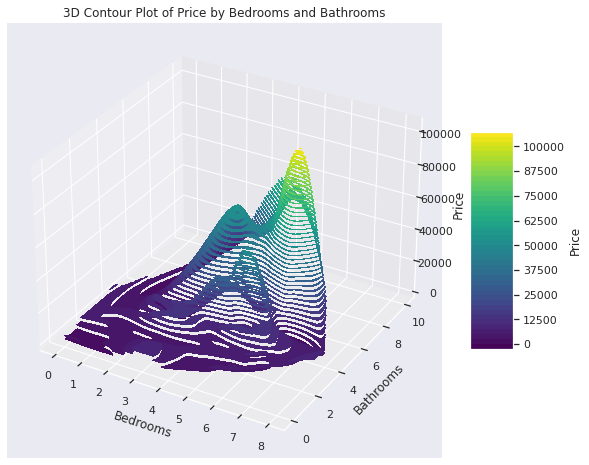

In [39]:
x = df['bedrooms']
y = df['bathrooms']
z = df['price']

# create grid values first
xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# interpolate
zi = griddata((x, y), z, (xi, yi), method='cubic')

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# plot the surface.
surf = ax.contourf(xi, yi, zi, 50, cmap='viridis', extend3d=True)

ax.set_xlabel('Bedrooms')
ax.set_ylabel('Bathrooms')
ax.set_zlabel('Price')
cbar = fig.colorbar(surf, shrink=0.5, aspect=5)
cbar.set_label('Price')

plt.title('3D Contour Plot of Price by Bedrooms and Bathrooms')
plt.show()

**Observation**: The 3D contour plot presents a visual representation of the relationship between the number of bedrooms and bathrooms and the price of rental properties. Peaks in the contour suggest that listings with a higher number of bedrooms and bathrooms tend to have higher prices. This multi-dimensional view allows for a nuanced understanding of how these variables interact. It's notable that prices increase steeply with the number of bathrooms compared to bedrooms, indicating that the presence of additional bathrooms may be a strong indicator of higher-priced listings.

## 21. Cluster Map

### Cluster map between features

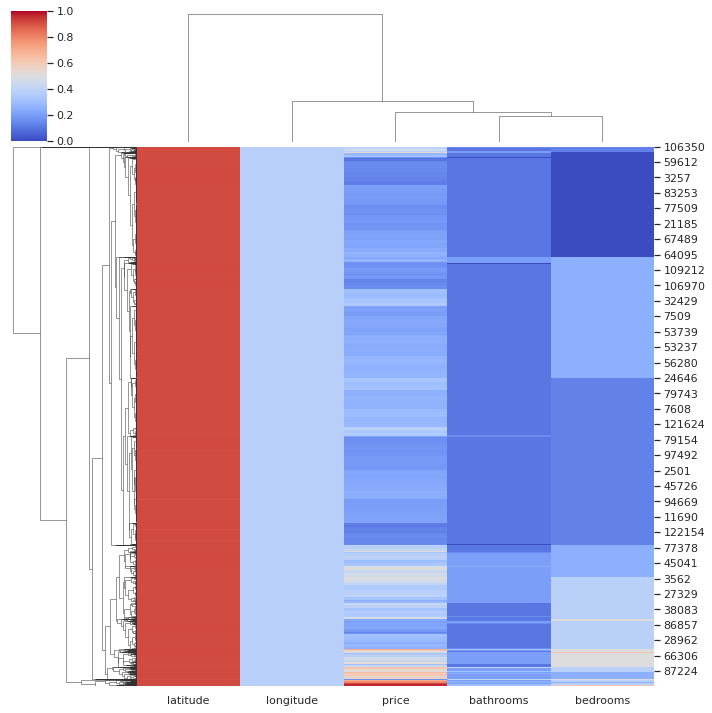

In [40]:
numerical_cols = ['bathrooms', 'bedrooms', 'latitude', 'longitude', 'price']
df_numerical = df_filtered[numerical_cols]
df_numerical = df_numerical.dropna()
sns.clustermap(df_numerical, method='average', cmap='coolwarm', standard_scale=1, figsize=(10, 10))
plt.show()

**Observation**: The cluster map shows hierarchical clustering applied to a subset of the dataset's numerical features: bathrooms, bedrooms, latitude, longitude, and price. The map uses color intensity to indicate the standardized value of each feature, with the dendrogram on the left indicating the similarity between different listings. Listings that are similar in terms of the selected features are clustered together. This visualization helps identify patterns and relationships within the data, such as the grouping of listings by location (latitude and longitude) or by the number of bedrooms and bathrooms, which may also relate to the price.

## 22. Hexbin

### Hexbin of NYC latitude and longitude

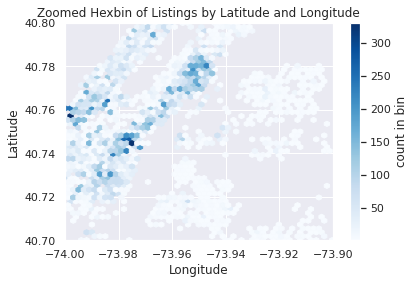

In [41]:
df_zoomed = df_filtered[(df_filtered['latitude'] > 40.7) & (df_filtered['latitude'] < 40.8) &
                        (df_filtered['longitude'] > -74) & (df_filtered['longitude'] < -73.9)]

# Now create the hexbin plot with the zoomed-in data
plt.hexbin(df_zoomed['longitude'], df_zoomed['latitude'], gridsize=50, cmap='Blues', mincnt=1)
cb = plt.colorbar(label='count in bin')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Zoomed Hexbin of Listings by Latitude and Longitude')
plt.xlim(-74, -73.9)
plt.ylim(40.7, 40.8)
plt.show()

**Observation**: The hexbin plot provides a visual density representation of listings based on their geographic location within a specific area of New York City. Darker hexagons represent a higher density of listings, indicating that these areas are more popular or have a higher concentration of available properties. The plot reveals that there are specific hotspots where listings are particularly dense, which could correlate with more desirable neighborhoods or areas with higher residential development. 

## 23. Strip Plot

### Price vs Interests

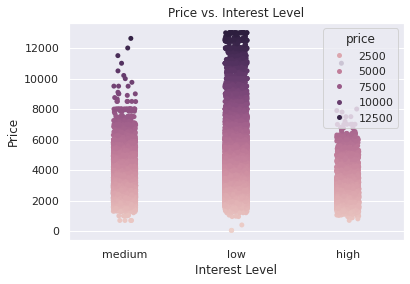

In [42]:
df_interest_label = ["low", "medium", "high"]
sns.stripplot(x="interest_level", y="price",data=df_filtered, hue="price");
plt.ylabel("Price")
plt.xlabel("Interest Level")
plt.title("Price vs. Interest Level")
plt.show()

**Observation**: The strip plot shows the distribution of rental prices across different interest levels. Listings with a 'low' interest level span a wide range of prices, while 'medium' and 'high' interest listings are more concentrated in lower price ranges. This could suggest that more competitively priced listings generate higher interest, regardless of the actual price point. The lack of high-interest listings at very high prices may indicate that price is a significant factor in generating interest, although this does not rule out the impact of other factors that are not depicted in this plot.

### Price vs Number of Bedrooms

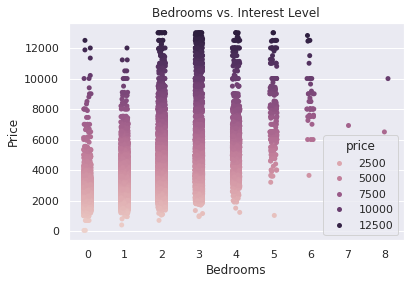

In [43]:
df_interest_label = ["low", "medium", "high"]
sns.stripplot(x="bedrooms", y="price",data=df_filtered, hue="price");
plt.ylabel("Price")
plt.xlabel("Bedrooms")
plt.title("Bedrooms vs. Interest Level")
plt.show()

**Observation**: The strip plot visualizes the relationship between the number of bedrooms in a listing and its price, with color intensity indicating the price level. The plot shows a wide distribution of prices across listings with different bedroom counts. Higher bedroom counts do not necessarily correlate with significantly higher prices. There's a considerable overlap in price distribution across different bedroom numbers, suggesting that factors other than the number of bedrooms are also influential in determining price. Listings with more bedrooms do not always command higher prices, indicating a diverse market with varied preferences and budgets.

### Price vs Number of Bathrooms

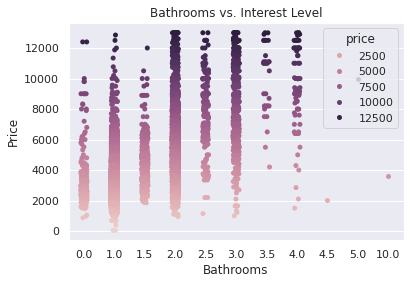

In [44]:
df_interest_label = ["low", "medium", "high"]
sns.stripplot(x="bathrooms", y="price", data=df_filtered, hue="price");
plt.ylabel("Price")
plt.xlabel("Bathrooms")
plt.title("Bathrooms vs. Interest Level")
plt.show()

**Observation**: The strip plot compares the number of bathrooms to the price of listings, with the color intensity reflecting the price level. It indicates a trend where listings with more bathrooms tend to have higher prices. However, there is a considerable overlap in the price ranges, particularly in listings with one to two bathrooms. The plot suggests that while the number of bathrooms can be an indicator of higher prices, the relationship is not strictly linear, and other factors likely play a role in the final listing price. The variety in price points for listings with a similar number of bathrooms indicates a diverse set of offerings in the market.

## 24. Swarm Plot

### Swarm plot from a sampled dataset

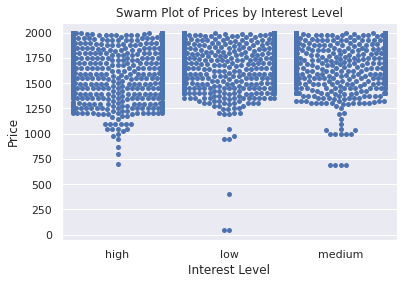

In [45]:
df_sampled = df_filtered[df_filtered['price'] < 2000]  # Adjust the range as needed

sns.swarmplot(x='interest_level', y='price', data=df_sampled)

plt.title('Swarm Plot of Prices by Interest Level')
plt.xlabel('Interest Level')
plt.ylabel('Price')

plt.show()

**Observation**: The swarm plot displays individual rental listings categorized by interest level ('high', 'low', 'medium') and price, filtered to show only those under $2000. It illustrates that the 'low' interest category has the widest range of prices, while 'high' interest listings are generally lower-priced. This suggests that affordability might drive interest. Listings are densely packed at lower price points across all interest levels, indicating a higher volume of lower-priced listings on the market. It's interesting to note that some higher-priced listings still garner 'high' interest, which could be due to desirable features not captured in the plot.

## 25. Subplot & Story-telling

### First subplot
Compare the distribution of prices, the number of bedrooms, the number of bathrooms, and the geographical density of listings across different interest levels (high, medium, low). This would provide a comprehensive view of what features influence interest levels.

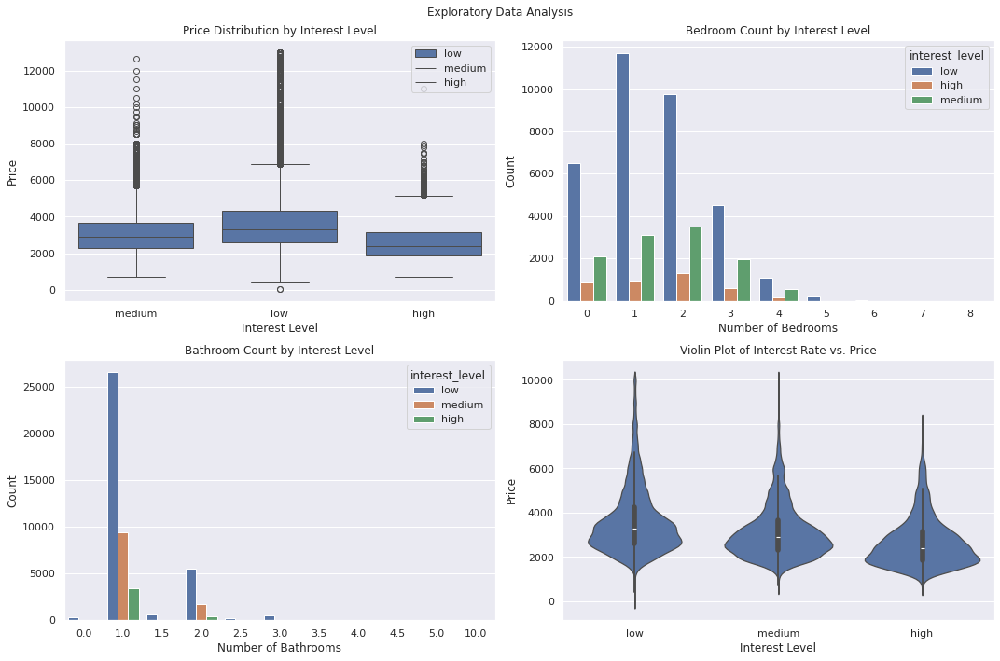

In [46]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10)) 

# Price vs Interest Level
df_interest_label = ["low", "medium", "high"]
sns.boxplot(ax=axs[0, 0], x='interest_level', y='price', data=df_filtered)
axs[0, 0].set_title('Price Distribution by Interest Level')
axs[0, 0].set_xlabel('Interest Level')
axs[0, 0].legend(df_interest_label, loc="best")
axs[0, 0].set_ylabel('Price')

# Bedrooms vs Interest Level
sns.countplot(ax=axs[0, 1], x='bedrooms', hue='interest_level', data=df_filtered)
axs[0, 1].set_title('Bedroom Count by Interest Level')
axs[0, 1].set_xlabel('Number of Bedrooms')
axs[0, 1].set_ylabel('Count')

# Bathrooms vs Interest Level
sns.countplot(ax=axs[1, 0], x='bathrooms', hue='interest_level', data=df_filtered)
axs[1, 0].set_title('Bathroom Count by Interest Level')
axs[1, 0].set_xlabel('Number of Bathrooms')
axs[1, 0].set_ylabel('Count')

# Violin plot of interest rate vs price
sns.violinplot(ax=axs[1, 1], x="interest_level", y="price", order=['low', 'medium', 'high'], data=df_filtered[df_filtered.price<=df_filtered.price.quantile(0.99)]);
axs[1, 1].set_title('Violin Plot of Interest Rate vs. Price')
axs[1, 1].set_xlabel('Interest Level')
axs[1, 1].set_ylabel('Price')

fig.suptitle('Exploratory Data Analysis')
plt.tight_layout()
plt.show()

**Observation**: The combined observation of the four plots indicates a multifaceted story of how different features relate to property prices within a dataset:
- Price Distribution by Interest Level: Prices vary significantly across different interest levels, with the 'low' interest level showing a wider range of prices, suggesting a diverse array of property values are considered less desirable.
- Bedroom Count by Interest Level: Most listings have 1 to 2 bedrooms, with the 'low' interest level having the highest counts, which could suggest that smaller properties are less desirable or more abundantly available.
- Bathroom Count by Interest Level: The 'low' interest level dominates the count across all numbers of bathrooms, which might indicate that properties with any number of bathrooms can be found undesirable based on other factors.
- Violin Plot of Interest Rate vs. Price: The violin plot displays the distribution of prices within each interest level category. The 'medium' interest level exhibits a tighter price distribution, hinting at a more homogeneous valuation within this category compared to the 'low' and 'high' interest levels that show wider variations in price.

Together, these plots suggest that while there's a general trend of increasing price with the number of bedrooms and bathrooms, the interest level plays a significant role in the distribution of property prices, with the 'low' interest level showing a wider range and higher counts of properties across various features.

### Second subplot

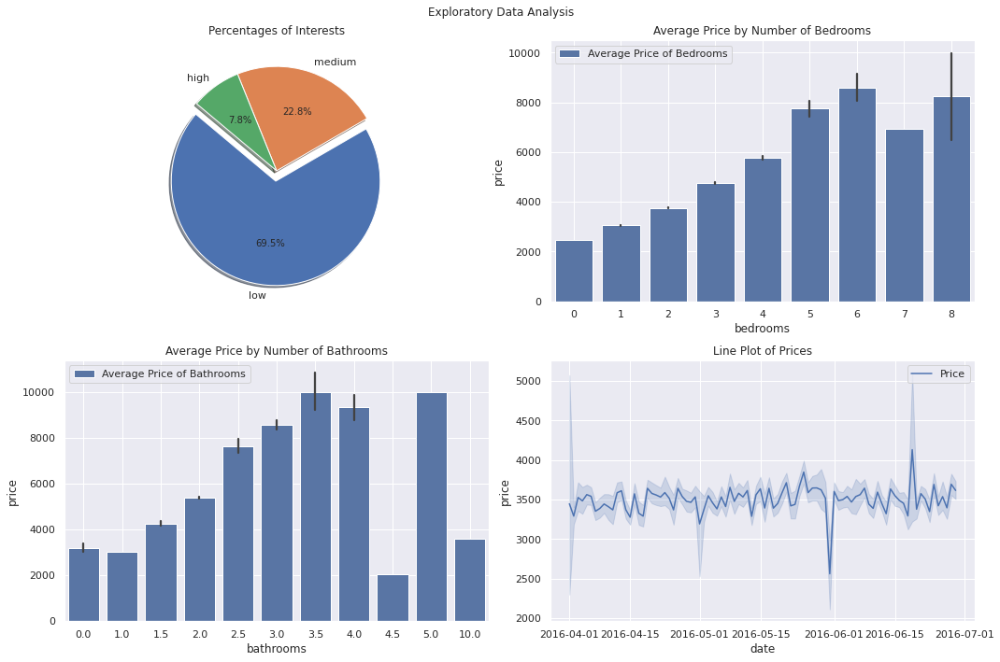

In [47]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Percentage of interest level
df_interest_split = df.interest_level.value_counts().values
df_interest_label = ["low", "medium", "high"]
explode = (0.1, 0, 0)
axes[0, 0].pie(df_interest_split, explode=explode, labels=df_interest_label, autopct='%1.1f%%', shadow=True, startangle=140)
axes[0, 0].set_title("Percentages of Interests")
axes[0, 0].grid(True)

# Count of listings by number of bedrooms and interest level
sns.barplot(x='bedrooms', y='price', data=df_filtered, label="Average Price of Bedrooms", ax=axes[0, 1])
axes[0, 1].set_title('Average Price by Number of Bedrooms')
axes[0, 1].legend()
axes[0, 1].grid(True)

# Count of listings by number of bathrooms and interest level
sns.barplot(x='bathrooms', y='price', data=df_filtered, label="Average Price of Bathrooms", ax=axes[1, 0])
axes[1, 0].set_title('Average Price by Number of Bathrooms')
axes[1, 0].legend()
axes[1, 0].grid(True)

# Scatter plot of price vs latitude
sns.lineplot(data=df_filtered, x="date", y="price", label="Price")
axes[1, 1].set_title('Line Plot of Prices')
axes[1, 1].grid(True)

fig.suptitle('Exploratory Data Analysis')
plt.tight_layout()
plt.show()

**Observation**: The combined observation from the four plots tells a multifaceted story about the dataset. The pie chart in the first subplot indicates that a significant majority of listings have a low interest level, suggesting that most apartments fail to capture high customer attention. The second and third subplots show the average price distribution across the number of bedrooms and bathrooms, respectively, revealing a trend where more bedrooms or bathrooms typically correspond to higher prices. The fourth subplot, a line plot of price trends over time, suggests price fluctuations with no clear upward or downward trend. This set of visualizations illustrates the variability in apartment interest levels, the influence of apartment features on price, and the dynamic nature of pricing over time within the New York City rental market.

### Third subplot

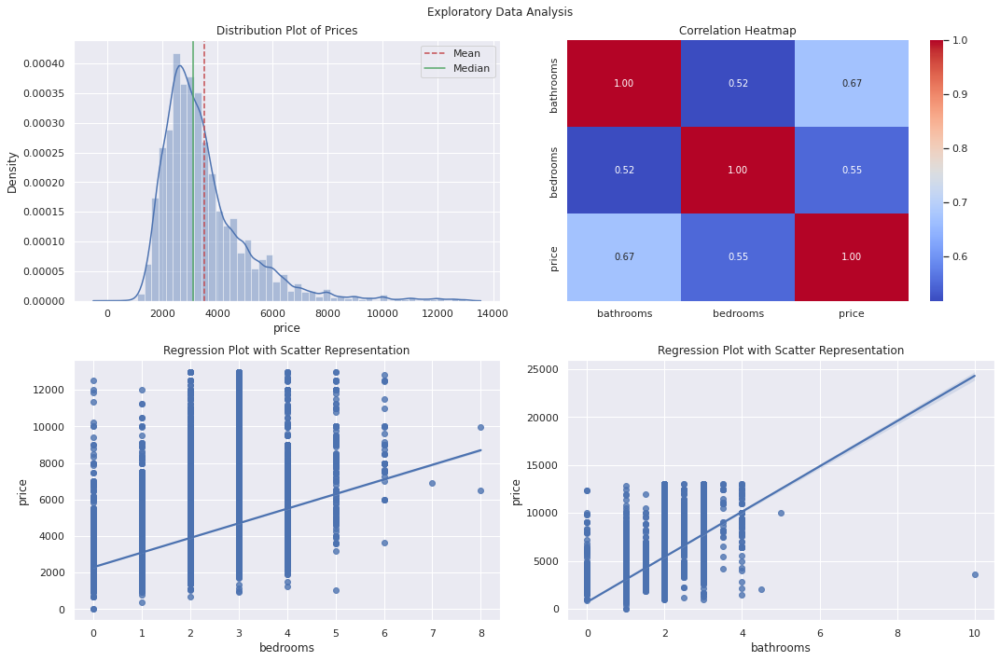

In [48]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Distplot of prices
sns.distplot(df_filtered["price"], ax=axes[0, 0])
axes[0, 0].axvline(x=df_filtered["price"].mean(), color='r', linestyle='--', label='Mean')
axes[0, 0].axvline(x=df_filtered["price"].median(), color='g', linestyle='-', label='Median')
axes[0, 0].set_title("Distribution Plot of Prices")
axes[0, 0].legend()
axes[0, 0].grid(True)

# Heatmap of features
corr = df_filtered[['bathrooms', 'bedrooms', 'price']].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, ax=axes[0, 1])
cbar = plt.gcf().axes[-1]
axes[0, 1].set_title('Correlation Heatmap')
axes[0, 1].grid(True)

# Regression plot between bedrooms and price
sns.regplot(x='bedrooms', y='price', data=df_filtered, scatter=True, fit_reg=True, ax=axes[1, 0])
axes[1, 0].set_title('Regression Plot with Scatter Representation')
axes[1, 0].grid(True)

# Regression plot between bathrooms and price
sns.regplot(x='bathrooms', y='price', data=df_filtered, scatter=True, fit_reg=True, ax=axes[1, 1])
axes[1, 1].set_title('Regression Plot with Scatter Representation')
axes[1, 1].grid(True)

fig.suptitle('Exploratory Data Analysis')
plt.tight_layout()
plt.show()

**Observation**: The subplot you have created tells a multifaceted story about the relationship between apartment features and their perceived value, as indicated by their price and interest levels.
- The first plot provides a foundational understanding of the general interest distribution in the dataset, showing most listings have low interest, followed by medium and very few high interest listings.
- The second show the positive correlation between price/bathrooms, price/bedrooms, and bedrooms/bathrooms
- The third and fourh plots dive deeper into the features, illustrating how the number of bedrooms and bathrooms impacts the average price. As expected, more bedrooms and bathrooms generally correlate with higher prices, indicating a trend where larger apartments tend to be more expensive.

Together, these visualizations highlight key factors that influence rental prices and interest levels in NYC apartment listings, offering a comprehensive view of the market dynamics.

### Fourth subplot

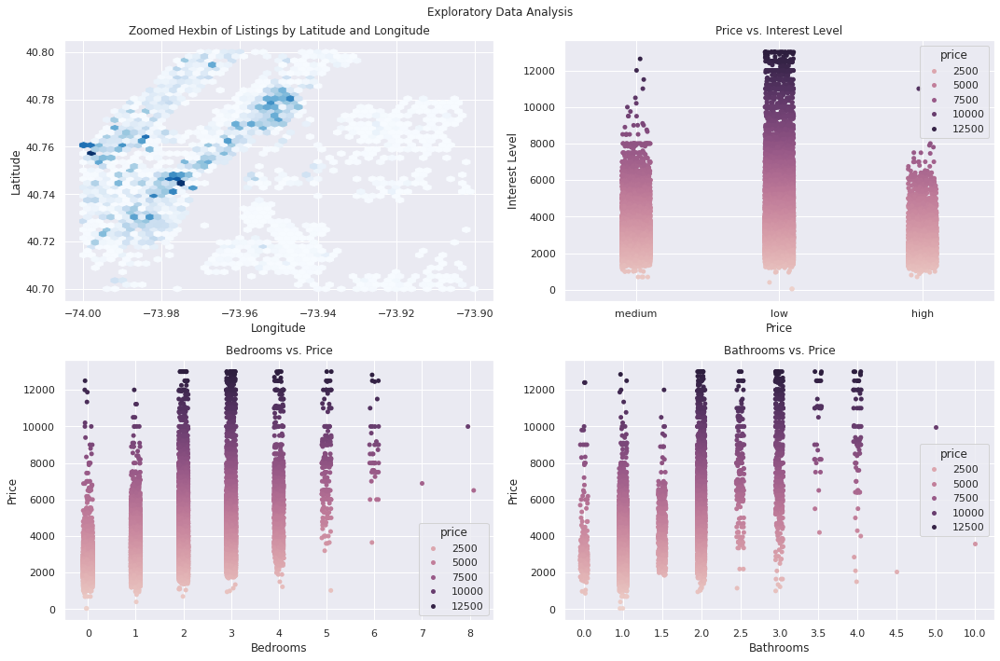

In [49]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
df_interest_label = ["low", "medium", "high"]

# Hexbin of NYC latitude and longitude
df_zoomed = df_filtered[(df_filtered['latitude'] > 40.7) & (df_filtered['latitude'] < 40.8) &(df_filtered['longitude'] > -74) & (df_filtered['longitude'] < -73.9)]
axes[0, 0].hexbin(df_zoomed['longitude'], df_zoomed['latitude'], gridsize=50, cmap='Blues', mincnt=1)
axes[0, 0].set_title('Zoomed Hexbin of Listings by Latitude and Longitude')
axes[0, 0].set_xlabel('Longitude')
axes[0, 0].set_ylabel('Latitude')
axes[0, 0].grid(True)

# Price vs Interests
sns.stripplot(x="interest_level", y="price",data=df_filtered, hue="price", ax=axes[0, 1]);
axes[0, 1].set_title('Price vs. Interest Level')
axes[0, 1].set_xlabel('Price')
axes[0, 1].set_ylabel('Interest Level')
axes[0, 1].grid(True)

# Price vs Number of Bedrooms
sns.stripplot(x="bedrooms", y="price",data=df_filtered, hue="price", ax=axes[1, 0]);
axes[1, 0].set_title('Bedrooms vs. Price')
axes[1, 0].set_xlabel('Bedrooms')
axes[1, 0].set_ylabel('Price')
axes[1, 0].grid(True)

# Price vs Number of Bathrooms
sns.stripplot(x="bathrooms", y="price",data=df_filtered, hue="price", ax=axes[1, 1]);
axes[1, 1].set_title('Bathrooms vs. Price')
axes[1, 1].set_xlabel('Bathrooms')
axes[1, 1].set_ylabel('Price')
axes[1, 1].grid(True)

fig.suptitle('Exploratory Data Analysis')
plt.tight_layout()
plt.show()

**Observation**: The subplot created from the provided code combines four different visualizations to narrate a story about the relationship between property features and price within a dataset. Here's an integrated observation:
- The Hexbin plot indicates a concentration of listings in a specific area, suggesting a potentially higher demand or density in that region.
- Price vs. Interest Level shows a spread of prices across different levels of interest, with no clear trend indicating that interest level may not be directly proportional to price, or that the data is too varied to discern a pattern from this visualization alone.
- Bedrooms vs. Price indicates a general trend where price increases with the number of bedrooms, but with a wide variance in price at each bedroom level, suggesting other factors also significantly influence price.
- Bathrooms vs. Price also displays a trend where more bathrooms could correlate with higher prices, but similar to the bedroom analysis, there's considerable variance.

Overall, these plots suggest that while the number of bedrooms and bathrooms tends to increase the price, the relationship is not strictly linear and is influenced by other factors, possibly including location as hinted by the Hexbin plot, and the varying interest levels that do not correlate directly with price. This highlights the complexity of real estate pricing, which is affected by a multitude of interdependent features.

## 26. Table

### Table of features correlation

In [50]:
corr = df_filtered[['bathrooms', 'bedrooms', 'price']].corr()
table = PrettyTable()
table.field_names = ["Feature"] + list(corr.columns)
for index, row in corr.iterrows():
    table.add_row([index] + list(row))
print(table)

+-----------+--------------------+--------------------+--------------------+
|  Feature  |     bathrooms      |      bedrooms      |       price        |
+-----------+--------------------+--------------------+--------------------+
| bathrooms |        1.0         | 0.5184547786890514 | 0.669340085581842  |
|  bedrooms | 0.5184547786890514 |        1.0         | 0.5501473450424671 |
|   price   | 0.669340085581842  | 0.5501473450424671 |        1.0         |
+-----------+--------------------+--------------------+--------------------+


**Observation**: The heatmap displays the correlation matrix for bathrooms, bedrooms, and price. The values, ranging from 0.52 to 0.67, indicate a moderate positive correlation between these features. This means as the number of bedrooms or bathrooms increases, the price tends to increase as well. The strongest correlation is between price and the number of bathrooms, suggesting that the number of bathrooms may be a more significant factor in determining the price than the number of bedrooms. This could be useful for modeling price predictions or understanding what features contribute most to rental costs.

## 27. Density Heatmap

### Density heatmap by price

In [51]:
# density heatmap by price
fig = px.density_mapbox(df_filtered, lat = 'latitude', lon = 'longitude', z = 'price',
                        radius = 8,
                        center=dict(lat=40.7128, lon=-74.0060),  # Center on NYC
                        zoom=9,  # Zoom level to focus on NYC
                        mapbox_style = 'open-street-map')
fig.show()

In [52]:
# density map by location
fig = px.scatter_mapbox(df_filtered, lat='latitude', lon='longitude',
                        zoom=10,  
                        center=dict(lat=40.7128, lon=-74.0060),  # Center on NYC
                        mapbox_style='open-street-map',
                        height=700)  

fig.show()

### Density heatmap by high interest level

In [53]:
# density heatmap by price
high_interest_df = df_filtered[df_filtered['interest_level'] == 'high']
fig = px.density_mapbox(high_interest_df, lat = 'latitude', lon = 'longitude', z = 'price',
                        radius = 8,
                        center=dict(lat=40.7128, lon=-74.0060),  # Center on NYC
                        zoom=9,  # Zoom level to focus on NYC
                        mapbox_style = 'open-street-map')
fig.show()

In [54]:
# density map by location
fig = px.scatter_mapbox(high_interest_df, lat='latitude', lon='longitude',
                        zoom=10,  
                        center=dict(lat=40.7128, lon=-74.0060),  # Center on NYC
                        mapbox_style='open-street-map',
                        height=700)  

fig.show()

### Density heatmap by medium interest level

In [55]:
# density heatmap by price
medium_interest_df = df_filtered[df_filtered['interest_level'] == 'medium']
fig = px.density_mapbox(medium_interest_df, lat = 'latitude', lon = 'longitude', z = 'price',
                        radius = 8,
                        center=dict(lat=40.7128, lon=-74.0060),  # Center on NYC
                        zoom=10,  # Zoom level to focus on NYC
                        mapbox_style = 'open-street-map')
fig.show()

In [56]:
# density map by location
fig = px.scatter_mapbox(medium_interest_df, lat='latitude', lon='longitude',
                        zoom=10,  
                        center=dict(lat=40.7128, lon=-74.0060),  # Center on NYC
                        mapbox_style='open-street-map',
                        height=700)  

fig.show()

### Density heatmap by low interest level

In [57]:
# density heatmap by price
low_interest_df = df_filtered[df_filtered['interest_level'] == 'low']
fig = px.density_mapbox(low_interest_df, lat = 'latitude', lon = 'longitude', z = 'price',
                        radius = 8,
                        center=dict(lat=40.7128, lon=-74.0060),  # Center on NYC
                        zoom=10,  # Zoom level to focus on NYC
                        mapbox_style = 'open-street-map')
fig.show()

In [58]:
# density map by location
fig = px.scatter_mapbox(low_interest_df, lat='latitude', lon='longitude',
                        zoom=10,  
                        center=dict(lat=40.7128, lon=-74.0060),  # Center on NYC
                        mapbox_style='open-street-map',
                        height=700)  

fig.show()